In [1]:
import os
import glob

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import tifffile as tiff 
from tqdm.auto import tqdm

class config:
    BASE_PATH = "../input/hubmap-organ-segmentation/"
    TRAIN_PATH = os.path.join(BASE_PATH, "train")

#Loading train df
df = pd.read_csv(
    os.path.join(config.BASE_PATH, "train.csv")
)
display(df.head())
df.info()

,id,organ,data_source,img_height,img_width,pixel_size,tissue_thickness,rle,age,sex
0,10044,prostate,HPA,3000,3000,0.4,4,1459676 77 1462675 82 1465674 87 1468673 92 14...,37.0,Male
1,10274,prostate,HPA,3000,3000,0.4,4,715707 2 718705 8 721703 11 724701 18 727692 3...,76.0,Male
2,10392,spleen,HPA,3000,3000,0.4,4,1228631 20 1231629 24 1234624 40 1237623 47 12...,82.0,Male
3,10488,lung,HPA,3000,3000,0.4,4,3446519 15 3449517 17 3452514 20 3455510 24 34...,78.0,Male
4,10610,spleen,HPA,3000,3000,0.4,4,478925 68 481909 87 484893 105 487863 154 4908...,21.0,Female


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 351 entries, 0 to 350
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   id                351 non-null    int64  
 1   organ             351 non-null    object 
 2   data_source       351 non-null    object 
 3   img_height        351 non-null    int64  
 4   img_width         351 non-null    int64  
 5   pixel_size        351 non-null    float64
 6   tissue_thickness  351 non-null    int64  
 7   rle               351 non-null    object 
 8   age               351 non-null    float64
 9   sex               351 non-null    object 
dtypes: float64(2), int64(4), object(4)
memory usage: 27.5+ KB


(3000, 3000, 3)


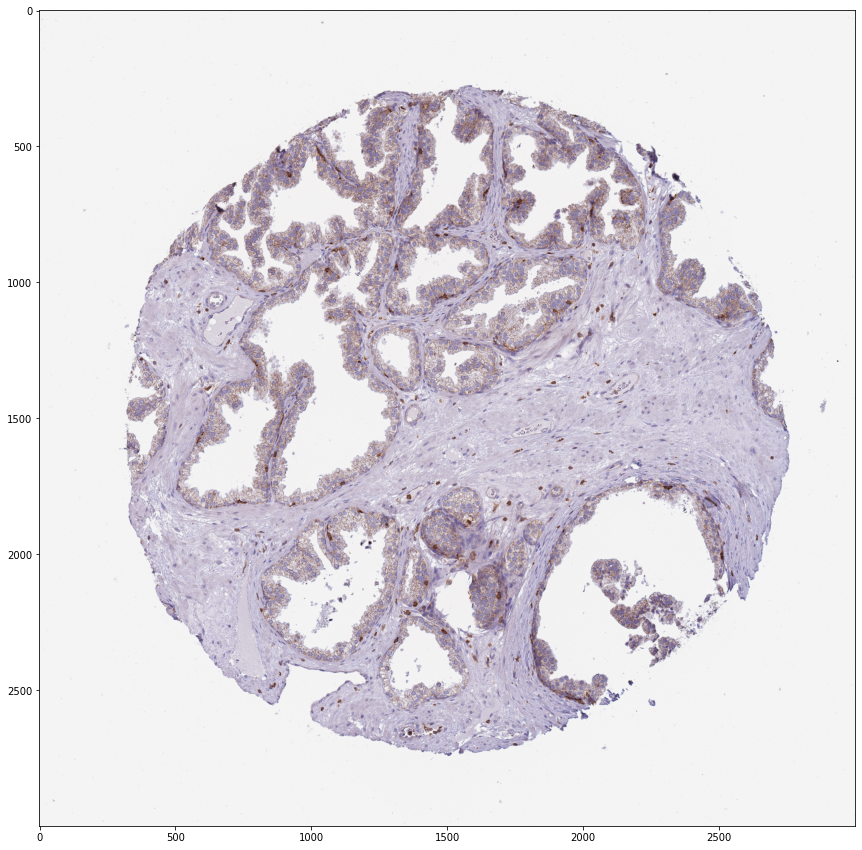

In [2]:
img_id_1 = 10044
img_1 = tiff.imread(config.BASE_PATH + "train_images/" + str(img_id_1) + ".tiff")
print(img_1.shape)
plt.figure(figsize=(15, 15))
plt.imshow(img_1)
# plt.axis("off")

(2023, 2023, 3)


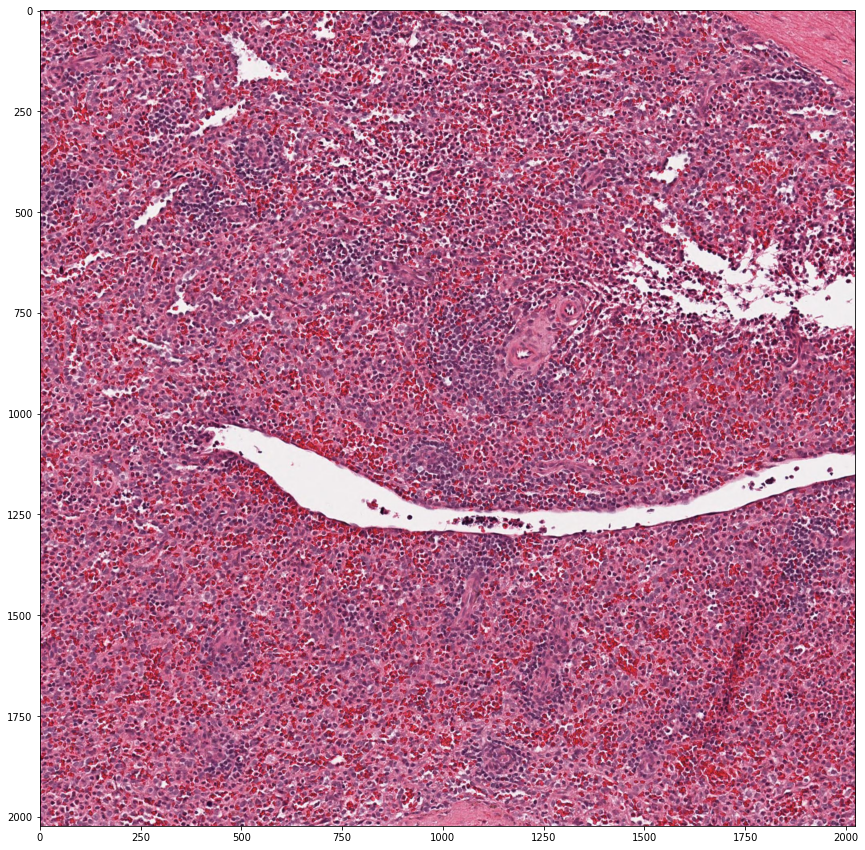

In [3]:
img_id_t1 = 10078
img_t1 = tiff.imread(config.BASE_PATH + "test_images/" + str(img_id_t1) + ".tiff")
print(img_t1.shape)
plt.figure(figsize=(15, 15))
plt.imshow(img_t1)
# plt.axis("off")

In [4]:
# https://www.kaggle.com/paulorzp/rle-functions-run-length-encode-decode
def mask2rle(img):
    '''
    img: numpy array, 1 - mask, 0 - background
    Returns run length as string formated
    '''
    pixels= img.T.flatten()
    pixels = np.concatenate([[0], pixels, [0]])
    runs = np.where(pixels[1:] != pixels[:-1])[0] + 1
    runs[1::2] -= runs[::2]
    return ' '.join(str(x) for x in runs)
 
def rle2mask(mask_rle, shape=(1600,256)):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (width,height) of array to return 
    Returns numpy array, 1 - mask, 0 - background

    '''
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape).T

In [5]:
mask_1 = rle2mask(df[df["id"]==img_id_1]["rle"].iloc[-1], (img_1.shape[1], img_1.shape[0]))
mask_1.shape

(3000, 3000)

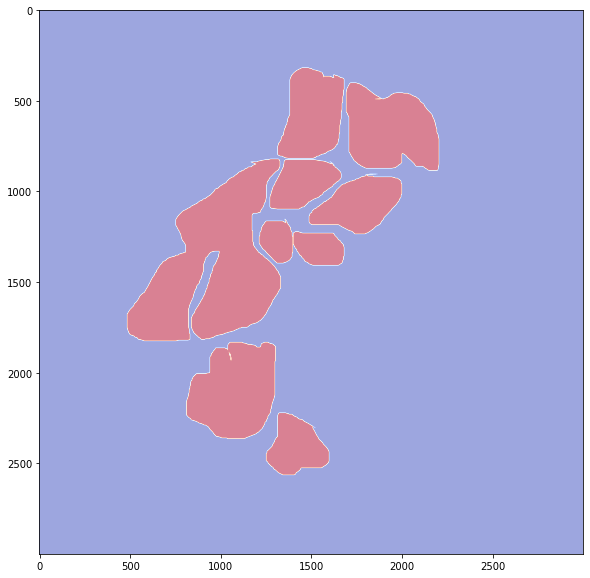

In [6]:
plt.figure(figsize=(10,10))
plt.imshow(mask_1, cmap='coolwarm', alpha=0.5)
# plt.axis("off")

(-0.5, 2999.5, 2999.5, -0.5)

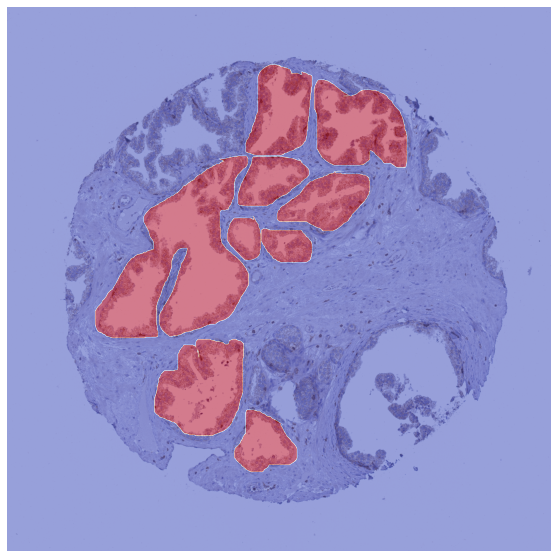

In [7]:
plt.figure(figsize=(10,10))
plt.imshow(img_1)
plt.imshow(mask_1, cmap='coolwarm', alpha=0.5)
plt.axis("off")

---

In [8]:
image_ids = df.id
image_files = glob.glob(config.BASE_PATH + "/train_images/*")

In [9]:
def save_table(table_name):
#     table = wandb.Table(columns=['Id', 'Image', 'Mask', 'Image with Mask'], allow_mixed_types = True)

    for id, img in tqdm(zip(image_ids, image_files), total = len(image_ids)):

        img = tiff.imread(img)
        mask = rle2mask(df[df["id"]==id]["rle"].iloc[-1], (img.shape[1], img.shape[0]))
        
        plt.figure(figsize=(10,10))
        plt.axis("off")
        plt.imshow(img)
        plt.imshow(mask, cmap='coolwarm', alpha=0.5)
        plt.savefig("./image.jpg")
        plt.close()

#         table.add_data(
#             id, 
#             wandb.Image(img), 
#             wandb.Image(mask),
#             wandb.Image(cv2.cvtColor(cv2.imread("./image.jpg"), cv2.COLOR_BGR2RGB))
#         )

#     wandb.log({table_name : table})
     
# save_table("Images and Masks Record")

### [Interactive W&B Table with all Images and their Masks $\rightarrow$](https://wandb.ai/ishandutta/hubmap-organ-segmentation/runs/3t9d7ioa?workspace=user-ishandutta)

## **<span style="color:orange;">Organ</span>** 

kidney            99
prostate          93
largeintestine    58
spleen            53
lung              48
Name: organ, dtype: int64

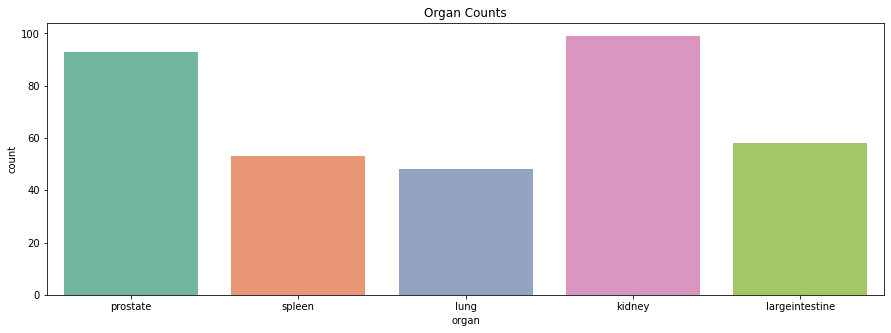

In [23]:
plt.figure(figsize=(15, 5))
g = sns.countplot(data=df, x="organ", palette=sns.color_palette("Set2", 8))
g.set_title("Organ Counts", color = "black")
df["organ"].value_counts().sort_values(ascending=False)

## **<span style="color:orange;">Data Source</span>** 

Text(0.5, 1.0, 'Data Source')

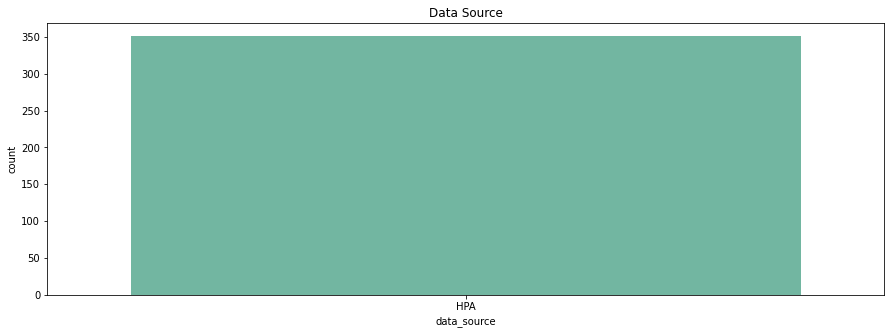

In [11]:
plt.figure(figsize=(15, 5))
g = sns.countplot(data=df, x="data_source", palette=sns.color_palette("Set2", 8))
g.set_title("Data Source", color = "black")

## **<span style="color:orange;">Age</span>** 

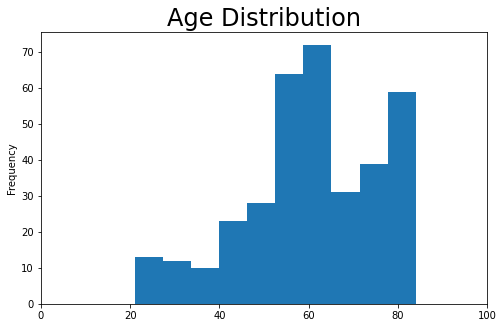

In [12]:
# plt.figure(figsize=(8, 5))
# g = sns.histplot(data=df, x="age", palette=sns.color_palette("Set2", 8))
# g.set_title("Age Distribution", color = "black")
# plt.xlim(0, 100)
# age distribution bar graph
plt.figure(figsize=(8,5))
df['age'].plot(kind='hist')
plt.title('Age Distribution', size=24)
plt.xlim(0, 100)
plt.show()

## **<span style="color:orange;">Sex</span>** 

Text(0.5, 1.0, 'Sex')

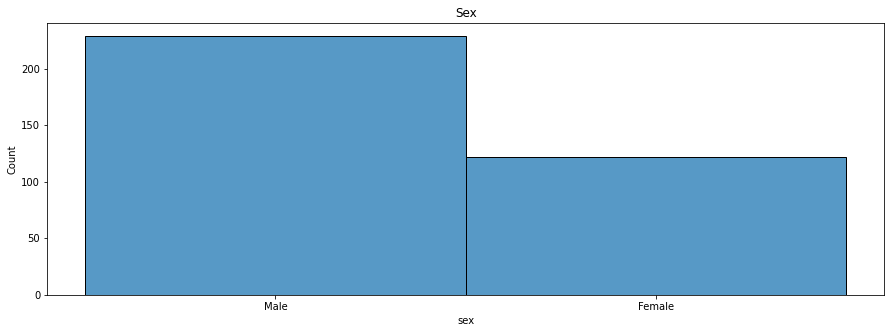

In [13]:
plt.figure(figsize=(15, 5))
g = sns.histplot(data=df, x="sex", palette=sns.color_palette("Set2", 8))
g.set_title("Sex", color = "black")

In [14]:
df[['img_height', 'img_width']].value_counts().sort_values(ascending=False)

img_height  img_width
3000        3000         326
2942        2942           2
2631        2631           2
2654        2654           2
2790        2790           2
2416        2416           2
2764        2764           2
2680        2680           1
2511        2511           1
2539        2539           1
2593        2593           1
2630        2630           1
2675        2675           1
2783        2783           1
2760        2760           1
2727        2727           1
2867        2867           1
2869        2869           1
2308        2308           1
3070        3070           1
dtype: int64

In [15]:
# Creating Train Dataset
import gc
import os
import cv2
import zipfile
import rasterio
import numpy as np
import pandas as pd
import tifffile as tiff
from PIL import Image
import matplotlib.pyplot as plt
from rasterio.windows import Window
from torch.utils.data import Dataset
from tqdm.notebook import tqdm
import math
import re

config = {
    'resize': (768,768),
    'resolution': (1024,1024),
    'DATA': '../input/hubmap-organ-segmentation/train_images',
    'MASKS' : '../input/hubmap-organ-segmentation/train.csv',
    'Window' : (250,2670),
    'bs': 64,
    'nfolds': 4,
    'fold': 0,
    'NUM_WORKERS': 4,
    'OUT_TRAIN' : 'train.zip',
    'OUT_MASKS' : 'masks.zip'
}

In [16]:
# functions to convert encoding to mask and mask to encoding
def enc2mask(encs, shape):
    '''
    Args:
    encs: list of rle masks
    shape: mask shape
    '''
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for m,enc in enumerate(encs):
        if isinstance(enc,np.float32) and np.isnan(enc): continue
        s = enc.split()
        for i in range(len(s)//2):
            start = int(s[2*i]) - 1
            length = int(s[2*i+1])
            img[start:start+length] = 1 + m
    return img.reshape(shape).T

def mask2enc(mask, n=1):
    pixels = mask.T.flatten()
    encs = []
    for i in range(1,n+1):
        p = (pixels == i).astype(np.int8)
        if p.sum() == 0: encs.append(np.nan)
        else:
            p = np.concatenate([[0], p, [0]])
            runs = np.where(p[1:] != p[:-1])[0] + 1
            runs[1::2] -= runs[::2]
            encs.append(' '.join(str(x) for x in runs))
    return encs

In [17]:
def visualize_batch(df, organ, slide):
    count = 0
    fig = plt.figure(figsize=(30,30))
    for index, row in df.iterrows():
        if count == 25: break
        
        if row['organ'] == organ:
            img = rasterio.open(os.path.join(config['DATA'],str(index)+'.tiff'), num_threads='all_cpus')
            mask = enc2mask([row['rle']],(img.shape[1],img.shape[0]))
        
            #read window slide
            img = img.read([1,2,3],window=Window.from_slices(slide, slide)) 
            mask = mask[slide[0]:slide[1], slide[0]:slide[1]] 
        
            plt.subplot(5,5, count+1)
            plt.imshow(np.transpose(img, (1,2,0)))
            plt.imshow(mask, cmap='seismic', alpha=0.4)
            plt.title(f'{index}', size=40)
            plt.axis('off')
            
            count += 1
            del img, mask
    
    plt.suptitle(f'{organ}', size=50, weight="bold", y = 1.0)      
    plt.show()   

In [18]:
df_masks = pd.read_csv(config['MASKS'])[['id', 'rle','organ']].set_index('id')
df_masks.head()

,rle,organ
id,,
10044,1459676 77 1462675 82 1465674 87 1468673 92 14...,prostate
10274,715707 2 718705 8 721703 11 724701 18 727692 3...,prostate
10392,1228631 20 1231629 24 1234624 40 1237623 47 12...,spleen
10488,3446519 15 3449517 17 3452514 20 3455510 24 34...,lung
10610,478925 68 481909 87 484893 105 487863 154 4908...,spleen


In [19]:
class HPADataset(Dataset):
    def __init__(self, idx, resize=config['resize'], slide=config['Window'], encs=None):
        self.data = rasterio.open(os.path.join(config['DATA'],str(idx)+'.tiff'), num_threads='all_cpus')
        # some images have issues with their format 
        # and must be saved correctly before reading with rasterio
        if self.data.count != 3:
            subdatasets = self.data.subdatasets
            self.layers = []
            if len(subdatasets) > 0:
                for i, subdataset in enumerate(subdatasets, 0):
                    self.layers.append(rasterio.open(subdataset))
                    
        self.shape = self.data.shape
        self.slide = slide
        self.resize = resize
        self.idx = idx
        
        self.mask = enc2mask(encs,(self.shape[1],self.shape[0])) if encs is not None else None
        
    def __len__(self):
        return 1
    
    def __getitem__(self, idx):
        # read img (RGB), mask (grayscale) from window slide
        # img, mask: uint8
        img = self.data.read([1,2,3],window=Window.from_slices(self.slide,self.slide)) 
        mask = self.mask[self.slide[0]:self.slide[1], self.slide[0]:self.slide[1]] 
        
        # resize
        img = cv2.resize(np.transpose(img,(1,2,0)),(self.resize[0],self.resize[1]),
                         interpolation = cv2.INTER_AREA)
        mask = cv2.resize(mask,(self.resize[0], self.resize[1]),
                          interpolation = cv2.INTER_NEAREST)
        
        return img, mask, self.idx

/opt/conda/lib/python3.7/site-packages/rasterio/__init__.py:220: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


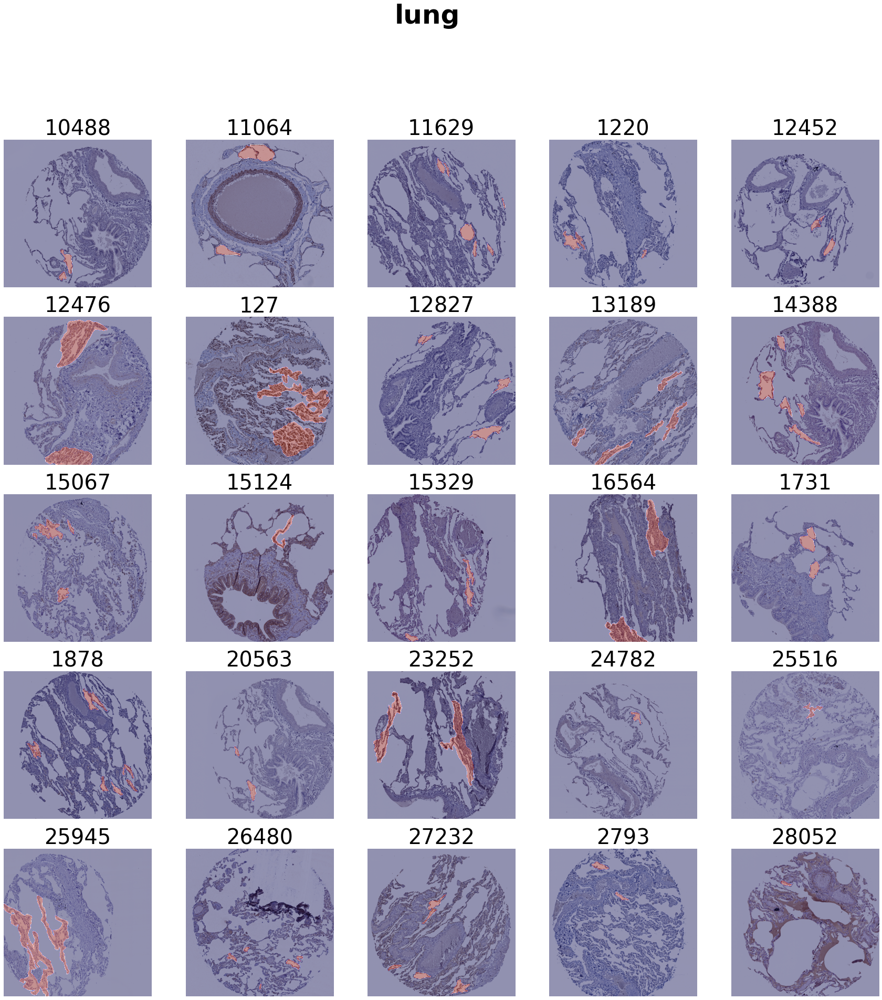

In [20]:
visualize_batch(df_masks, 'lung', config['Window'])

In [21]:
x_tot,x2_tot = [],[]
with zipfile.ZipFile(config['OUT_TRAIN'], 'w') as img_out,\
 zipfile.ZipFile(config['OUT_MASKS'], 'w') as mask_out:
    for index, encs in tqdm(df_masks.iterrows(),total=len(df_masks)):
        #image+mask dataset
        ds = HPADataset(index,encs=encs)
        if index == 31800: continue
        for i in range(len(ds)):
            img, m, idx = ds[i]

            x_tot.append((img/255.0).reshape(-1,3).mean(0))
            x2_tot.append(((img/255.0)**2).reshape(-1,3).mean(0))

            #write data   
            img = cv2.imencode('.png',cv2.cvtColor(img, cv2.COLOR_RGB2BGR))[1]
            img_out.writestr(f'{index}.png', img)
            m = cv2.imencode('.png',m)[1]
            mask_out.writestr(f'{index}.png', m)
        
#image stats
img_avr =  np.array(x_tot).mean(0)
img_std =  np.sqrt(np.array(x2_tot).mean(0) - img_avr**2)
print('mean:',img_avr, ', std:', img_std)

  0%|          | 0/351 [00:00<?, ?it/s]

mean: [0.77365666 0.73692312 0.7629131 ] , std: [0.16341681 0.19100335 0.1840384 ]


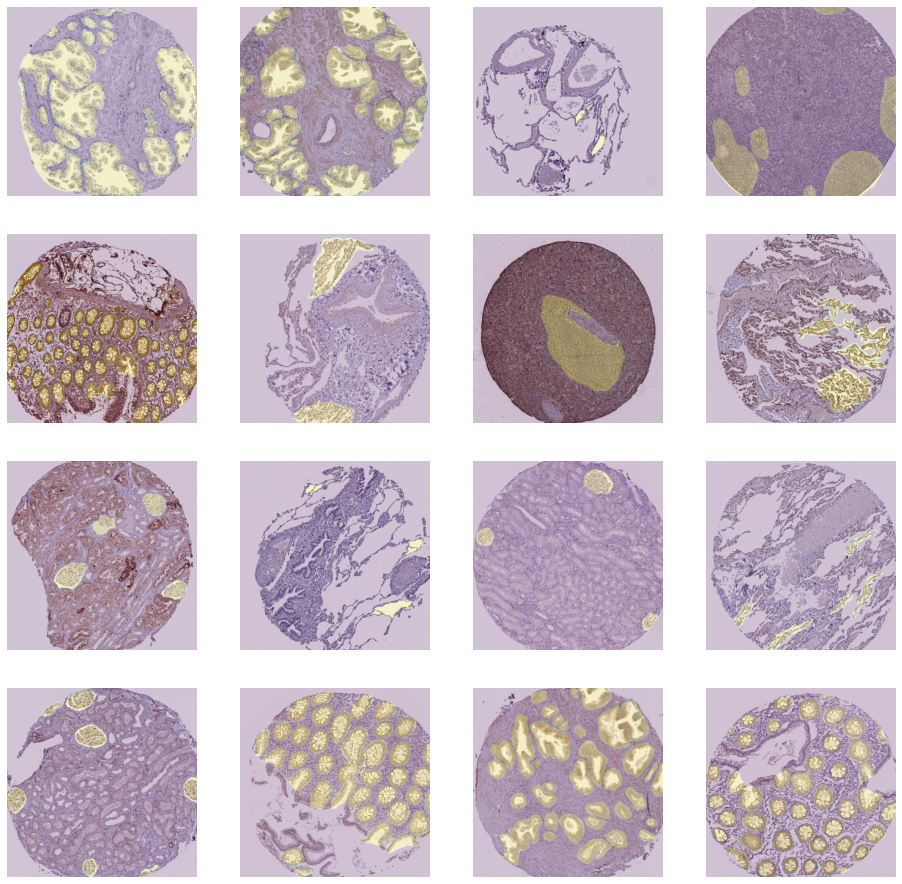

In [22]:
cols, rows = 4,4
idx0 = 20
fig=plt.figure(figsize=(cols*4, rows*4))
with zipfile.ZipFile(config['OUT_TRAIN'], 'r') as img_arch, \
     zipfile.ZipFile(config['OUT_MASKS'], 'r') as msk_arch:
    fnames = sorted(img_arch.namelist())[8:]
    #print(fnames)
    for i in range(rows):
        for j in range(cols):
            idx = i+j*cols
            img = cv2.imdecode(np.frombuffer(img_arch.read(fnames[idx0+idx]), 
                                             np.uint8), cv2.IMREAD_COLOR)
            img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
            mask = cv2.imdecode(np.frombuffer(msk_arch.read(fnames[idx0+idx]), 
                                              np.uint8), cv2.IMREAD_GRAYSCALE)
            fig.add_subplot(rows, cols, idx+1)
            plt.axis('off')
            plt.imshow(Image.fromarray(img))
            plt.imshow(Image.fromarray(mask), alpha=0.2)
plt.show()